<a href="https://colab.research.google.com/gist/dsaint31x/5dbd4fdcac38108c9fe5a055dfe9778c/pillow_basic04_image_filter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pillow - ImageFilter 모듈

참고: [Pillow 사용법 - Basic 04 - ImageFilter](https://ds31x.tistory.com/468)

In [1]:
from skimage import data
from PIL import Image, ImageEnhance

In [2]:
img_array = data.astronaut()
img_array.shape

(512, 512, 3)

In [3]:
def combine_img(img0, img1):
  w,h  = img0.size
  img1 = img1.resize((w,h))
  combined = Image.new("RGB", (w*2, h))
  combined.paste(img0, (0,0))
  combined.paste(img1, (w,0))
  return combined

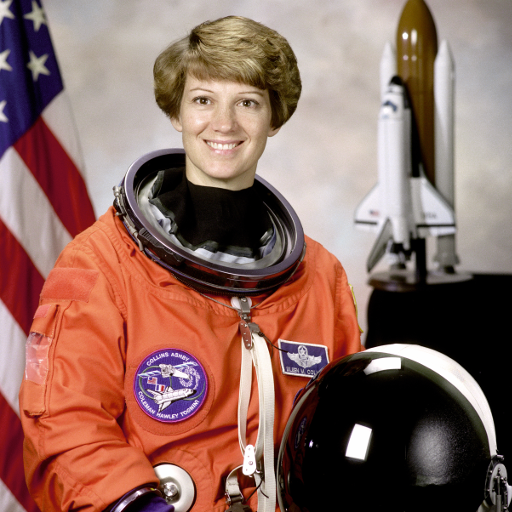

In [4]:
img = Image.fromarray(img_array)
img

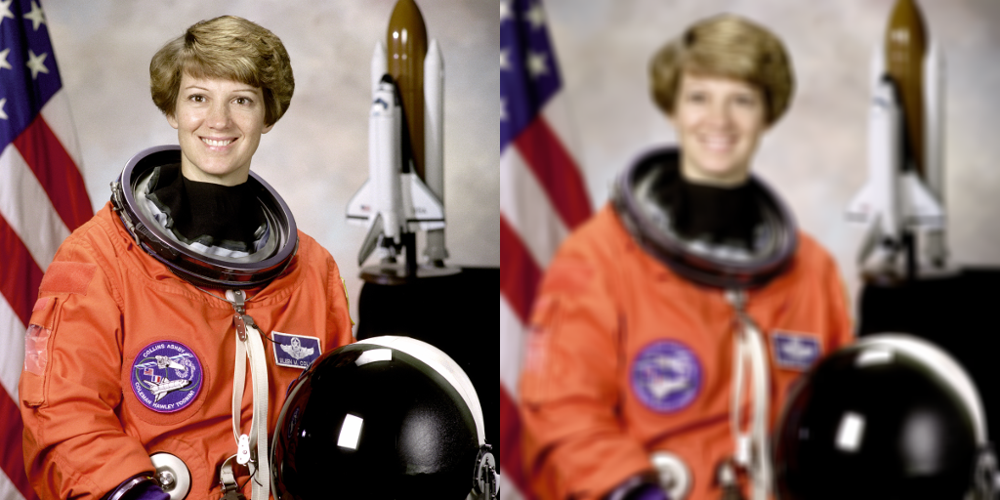

In [5]:
from PIL import ImageFilter
blurred_img = img.filter(ImageFilter.BoxBlur(radius=4.5))
combine_img(img,blurred_img)

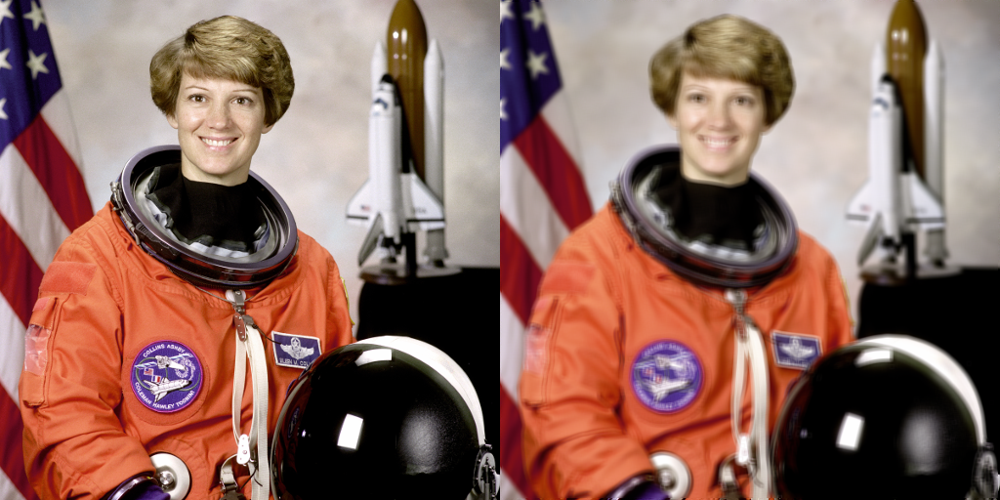

In [6]:
from PIL import ImageFilter
blurred_img = img.filter(ImageFilter.BLUR)
combine_img(img,blurred_img)

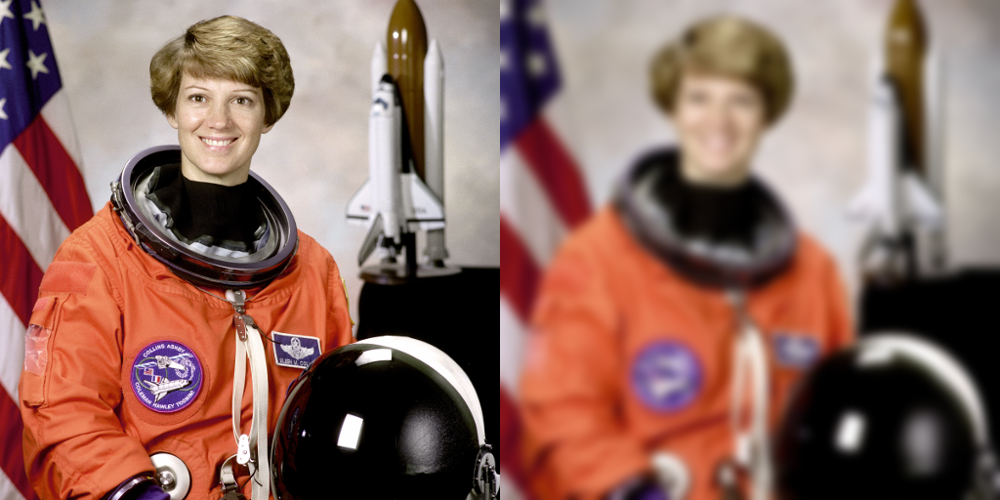

In [7]:
gaussian_blur = ImageFilter.GaussianBlur(radius=5)
blurred_img = img.filter(gaussian_blur)
combine_img(img,blurred_img)

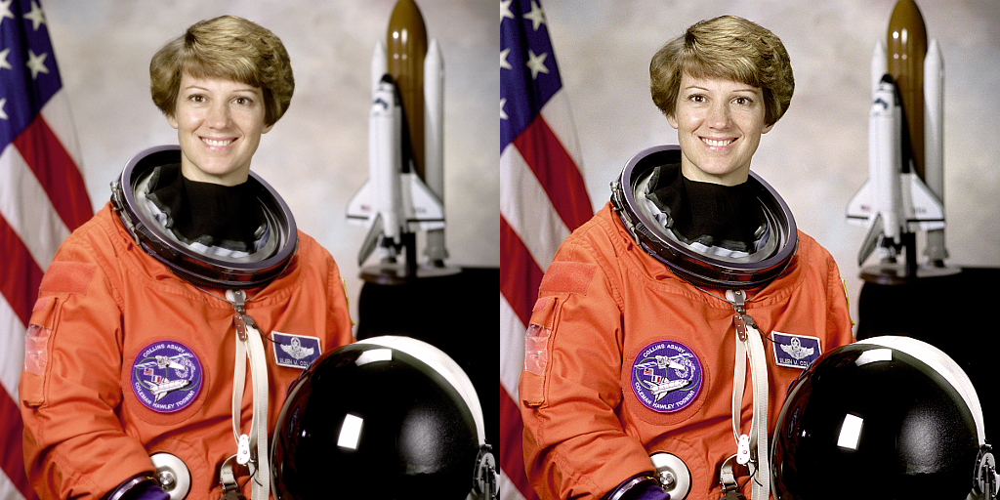

In [8]:
sharpened_img = img.filter(ImageFilter.SHARPEN)
combine_img(img,sharpened_img)

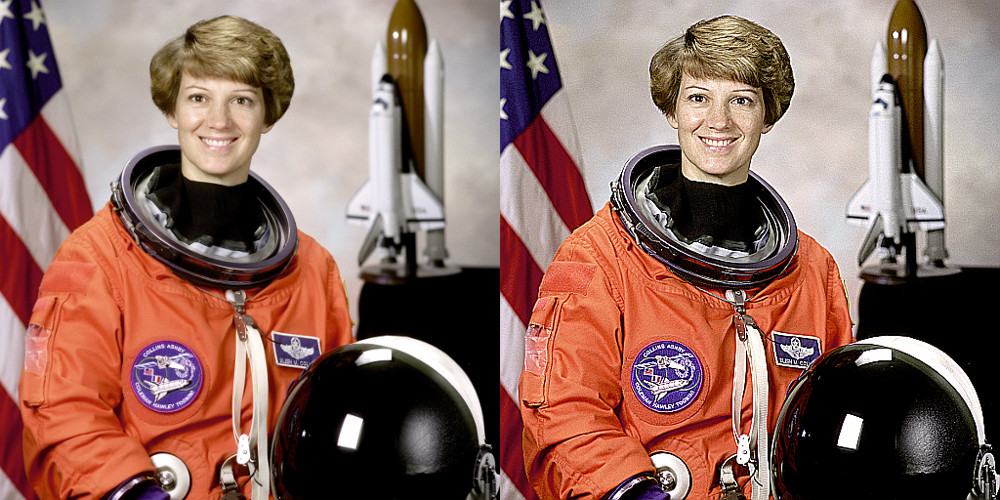

In [9]:
edge_enhanced = img.filter(ImageFilter.EDGE_ENHANCE)
combine_img(img,edge_enhanced)

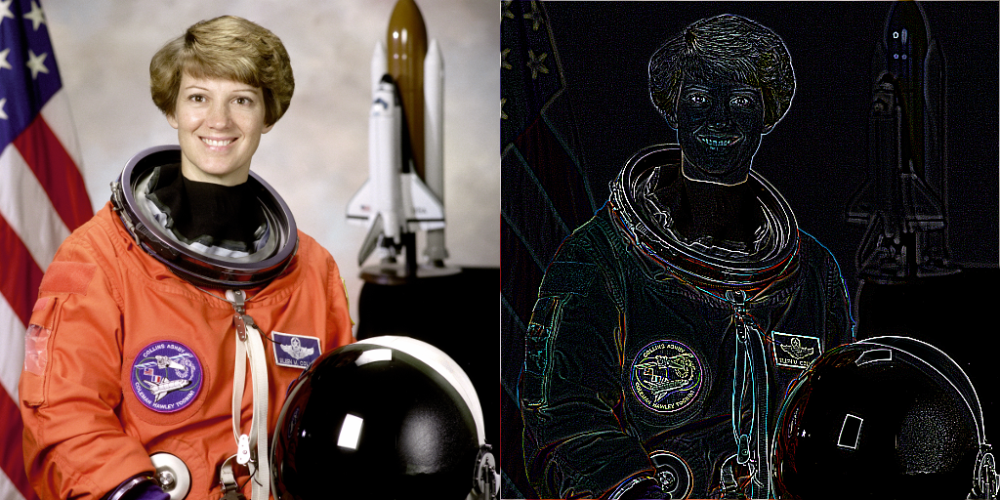

In [10]:
edges = img.filter(ImageFilter.FIND_EDGES)
combine_img(img,edges)

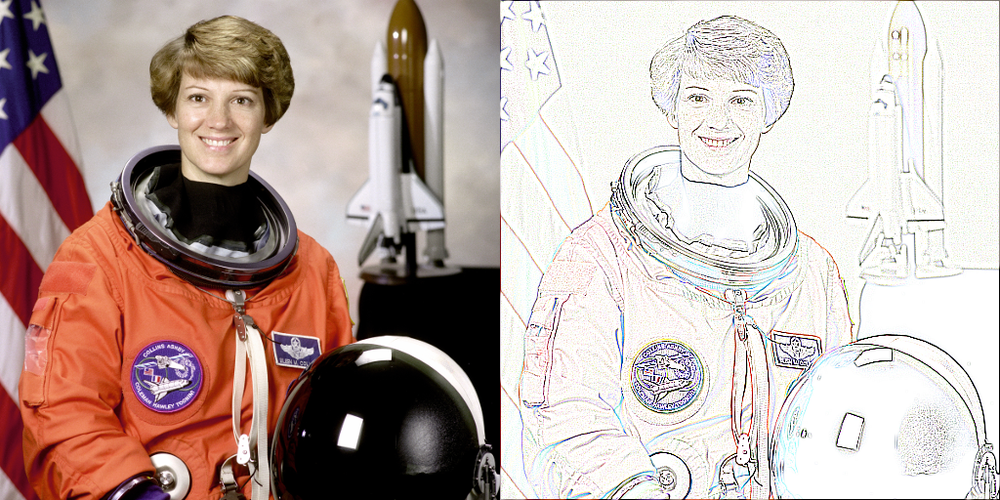

In [11]:
contour = img.filter(ImageFilter.CONTOUR)
combine_img(img,contour)

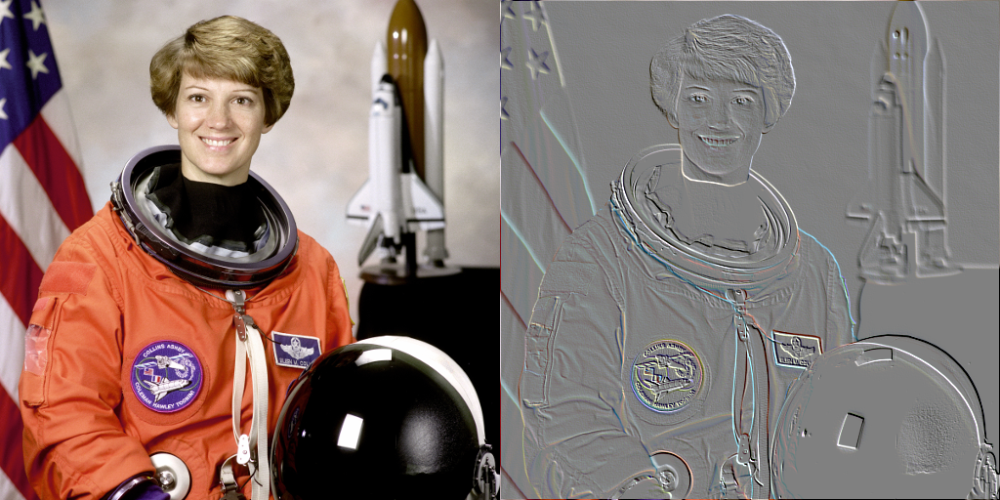

In [12]:
embossed = img.filter(ImageFilter.EMBOSS)
combine_img(img,embossed)

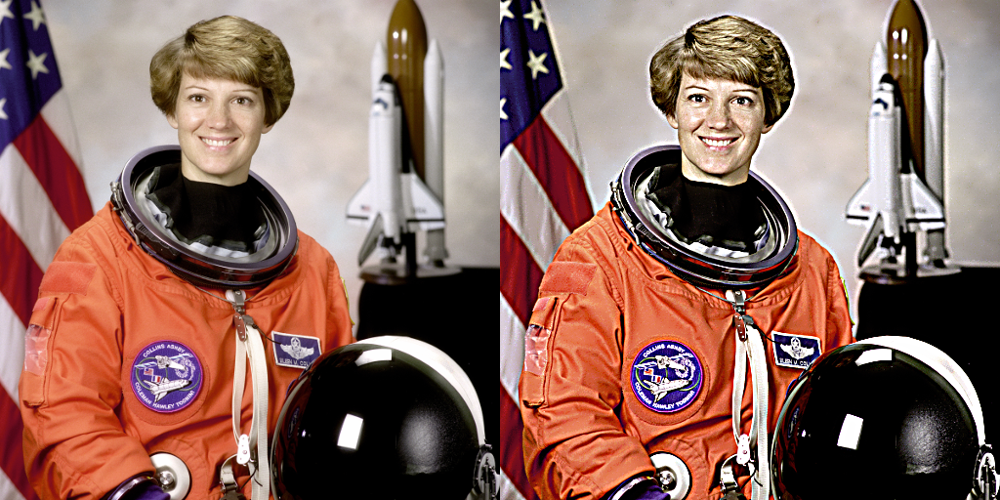

In [13]:
unsharp = ImageFilter.UnsharpMask(radius=3, percent=200, threshold=5)
sharpened = img.filter(unsharp)
combine_img(img,sharpened)

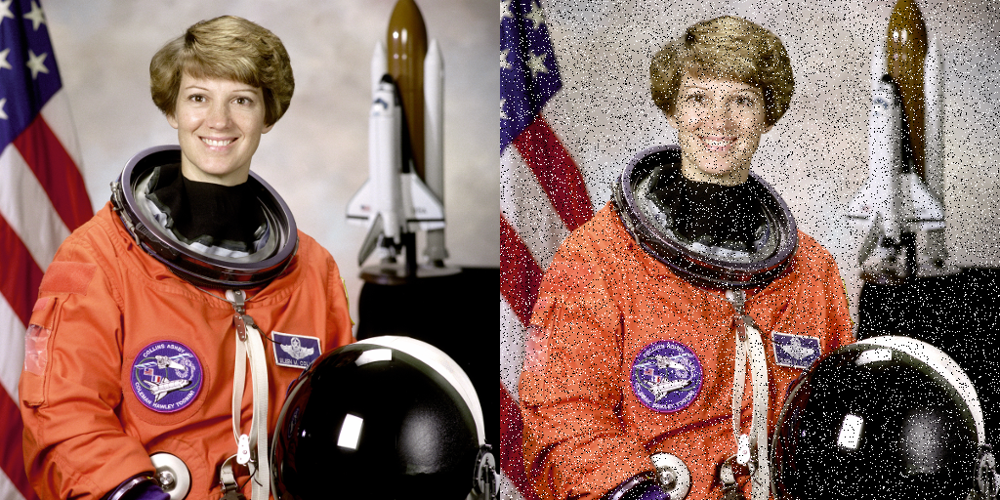

In [14]:
import numpy as np

def add_salt_and_pepper_noise(image, salt_vs_pepper, amount):
    img_array = np.array(image)
    noisy_img_array = np.copy(img_array)
    # Salt mode
    num_salt = np.ceil(amount * img_array.size * salt_vs_pepper).astype(int)
    coords_salt_x = np.random.randint(0, img_array.shape[0], num_salt)
    coords_salt_y = np.random.randint(0, img_array.shape[1], num_salt)
    noisy_img_array[coords_salt_x, coords_salt_y] = 255

    # Pepper mode
    num_pepper = np.ceil(amount * img_array.size * (1.0 - salt_vs_pepper)).astype(int)
    coords_pepper_x = np.random.randint(0, img_array.shape[0], num_pepper)
    coords_pepper_y = np.random.randint(0, img_array.shape[1], num_pepper)
    noisy_img_array[coords_pepper_x, coords_pepper_y] = 0
    return Image.fromarray(noisy_img_array)

noisy_img = add_salt_and_pepper_noise(img, salt_vs_pepper=0.5, amount=0.04)
combine_img(img, noisy_img)

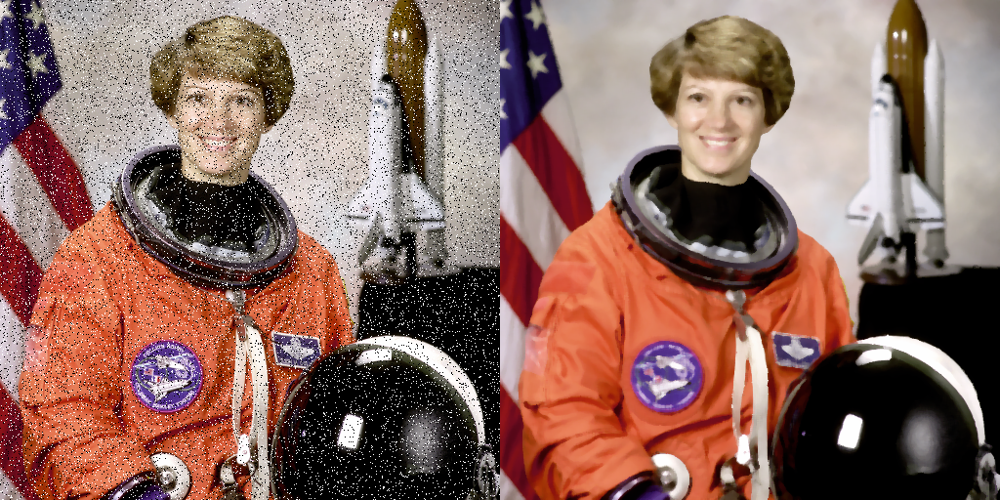

In [15]:
median = ImageFilter.MedianFilter(size=5)
denoised = noisy_img.filter(median)
combine_img(noisy_img,denoised)

## Custom Filter

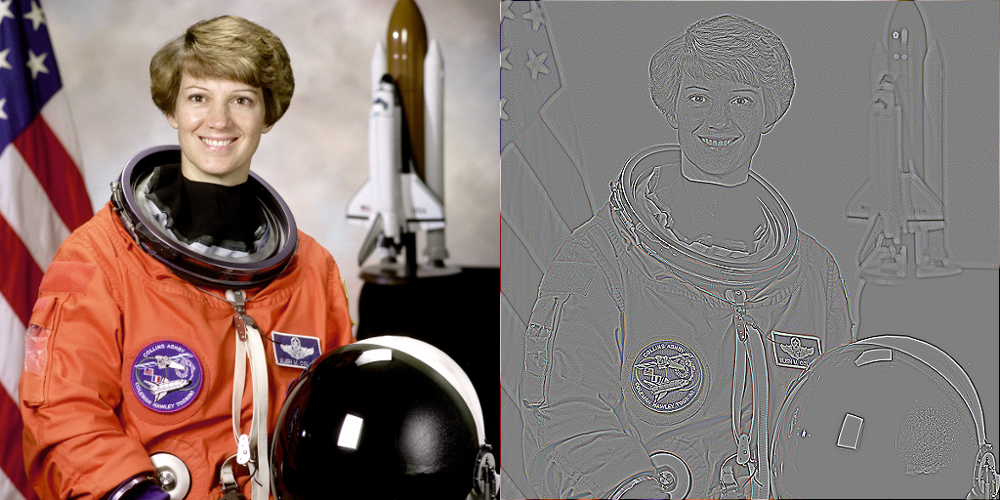

In [21]:
from PIL import ImageFilter
import numpy as np

kernel = np.array([[0, -1, 0],
                   [-1, 4,-1],
                   [0, -1, 0]])

# Flatten the kernel array to a list
pil_kernel = ImageFilter.Kernel((3, 3), kernel.flatten().tolist(), 1, 128)

sharpened = img.filter(pil_kernel)

combine_img(img,sharpened)